# Ex 1 - Image Analysis Introduction

In [ ]:
import os
from skimage import color, io, measure, img_as_ubyte
from skimage.measure import profile_line
from skimage.transform import rescale, resize
import matplotlib.pyplot as plt
import numpy as np
import pydicom as dicom
# You may need ipympl: pip install ipympl
#%matplotlib widget
#%matplotlib nbagg

ModuleNotFoundError: No module named 'ipympl'

Exercise 1: Start by reading the image:



In [3]:
# Directory containing data and images
in_dir = "data/"

# X-ray image
im_name = "metacarpals.png"

# Read the image.
# Here the directory and the image name is concatenated  by "+" to give the full path to the image.
im_org = io.imread(os.path.join(in_dir, im_name))
print(im_org)

[[ 63  67  68 ... 148 148 150]
 [ 65  67  67 ... 147 148 150]
 [ 63  67  67 ... 147 147 150]
 ...
 [ 59  59  60 ... 157 157 160]
 [ 59  57  60 ... 158 159 157]
 [ 51  56  57 ... 160 158 152]]


## Ex 2 and 3
Exercise 2: Check the image dimensions and pixel Type:



In [4]:
print(im_org.shape)
print(im_org.dtype)

(512, 512)
uint8


## Ex 4
Display the image and try to use the simple viewer tools like the zoom tool to inspect the finger bones. You can see the pixel values at a given pixel position (in x, y coordinates) in the upper right corner. Where do you see the highest and lowest pixel values?

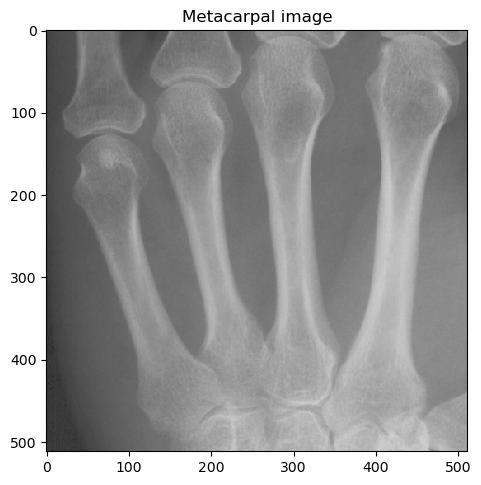

In [14]:
io.imshow(im_org)
plt.title("Metacarpal image")
io.show()

## Ex 5

Exercise 5: Display an image using colormap:
When working with gray level images, they are viewed using 256 levels of gray. There is another method of viewing them using a color map where each gray level is shown as a color. Matplotlib has several predefined color maps.




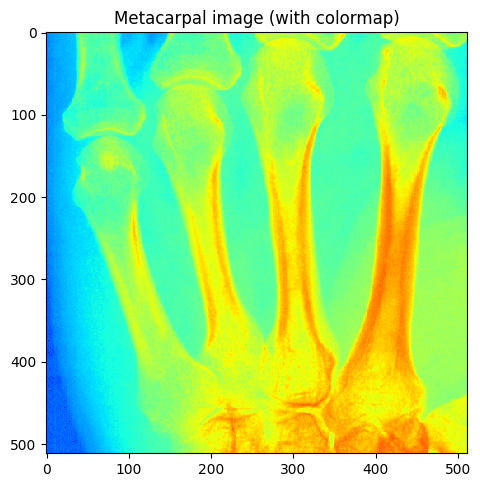

In [5]:
io.imshow(im_org, cmap="jet")
plt.title('Metacarpal image (with colormap)')
io.show()

## Ex 6

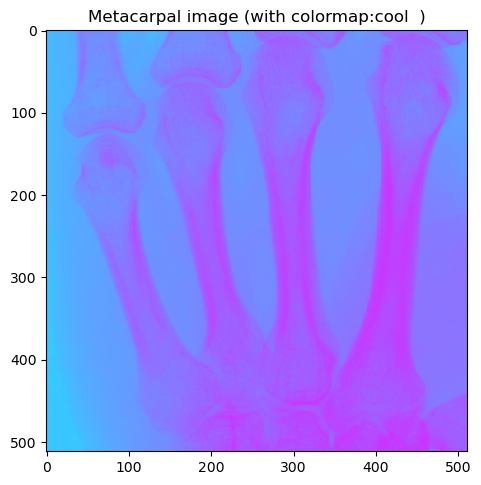

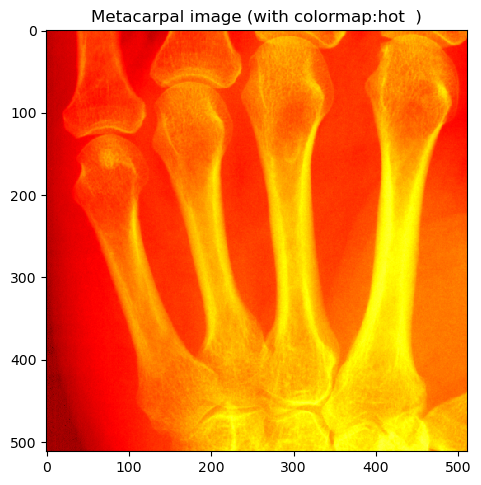

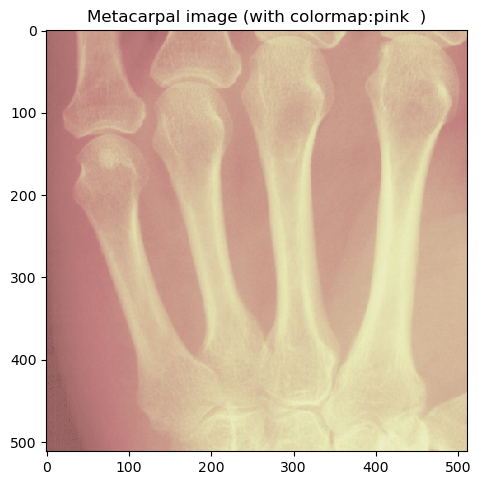

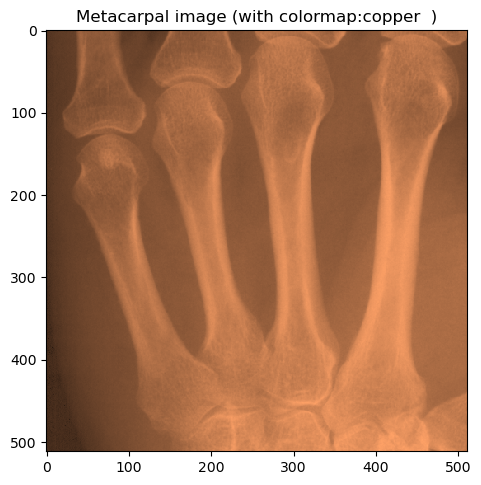

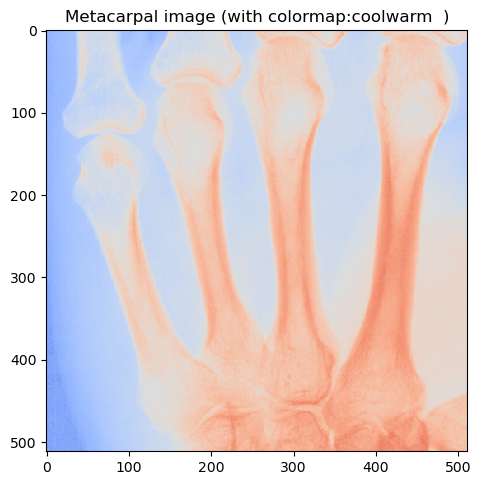

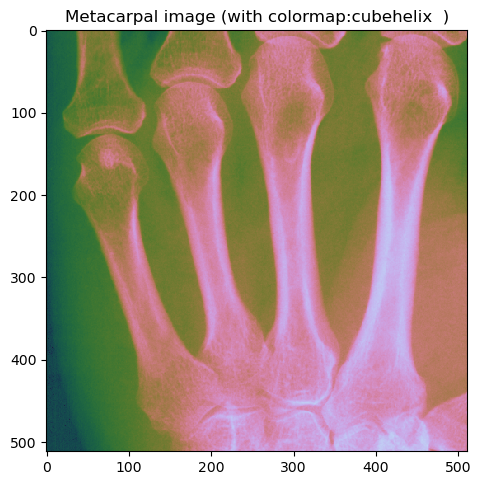

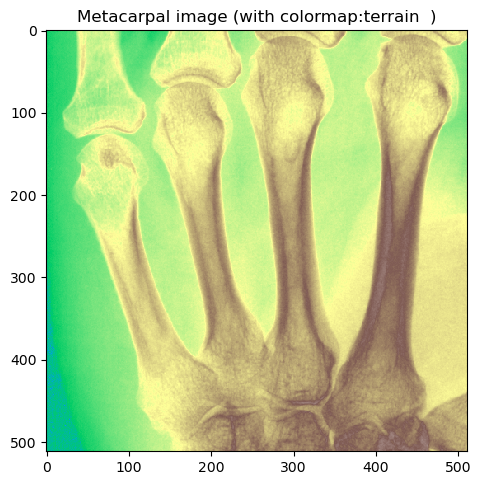

In [ ]:
# Experiment with different colormaps. For example cool, hot, pink, copper, coolwarm, cubehelix, and terrain.

colormaps = ["cool", "hot", "pink", "copper", "coolwarm", "cubehelix", "terrain"]

# BUCLE LOOP
for cmap in colormaps:
    io.imshow(im_org, cmap=cmap)
    plt.title('Metacarpal image (with colormap:'+ cmap +')') #inserta el cmap dentro de 
    io.show()

## Ex 7
Sometimes, there is a lack of contrast in an image or the brightness levels are not optimals. It possible to scale the way the image is visualized, by forcing a pixel value range to use the full gray scale range (from white to black).

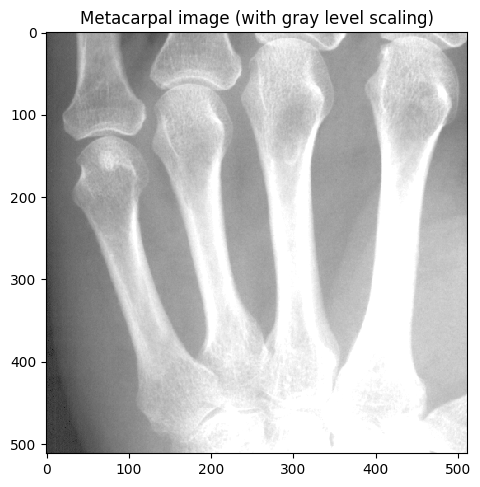

In [ ]:
io.imshow(im_org, vmin=20, vmax=170) # valores de 20 pa abajo seran 0(negro) y de 170 pa arriba blanco
plt.title('Metacarpal image (with gray level scaling)')
io.show()

##Exercise 7: 

Try to find a way to automatically scale the visualization, so the pixel with the lowest value in the image is shown as black and the pixel with the highest value in the image is shown as white.

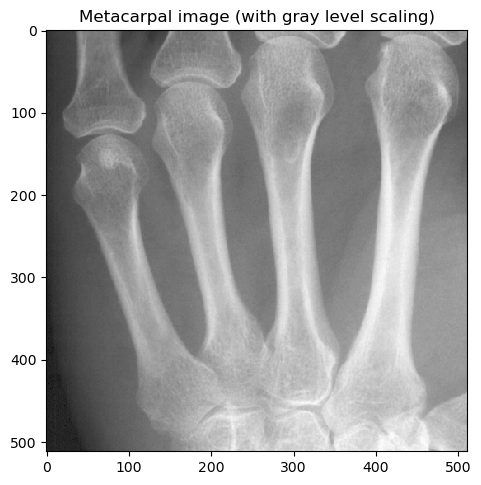

In [18]:
io.imshow(im_org, vmin=np.min(im_org), vmax=np.max(im_org))
plt.title('Metacarpal image (with gray level scaling)')
io.show()

## Ex 8 Histogram functions


In [8]:
nbins = 256
%matplotlib inline

The bin values of the histogram can also be stored by writing:



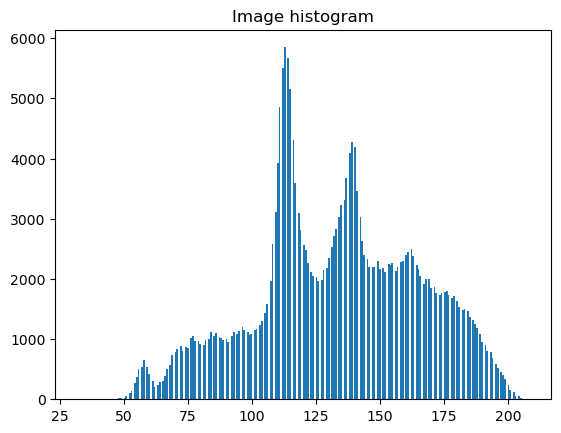

In [9]:
plt.hist(im_org.ravel(), bins=nbins) # los bins son el numero total de intervalos de la img
#ravel es para pasar de una matriz a un vector 1D
plt.title('Image histogram')
io.show()

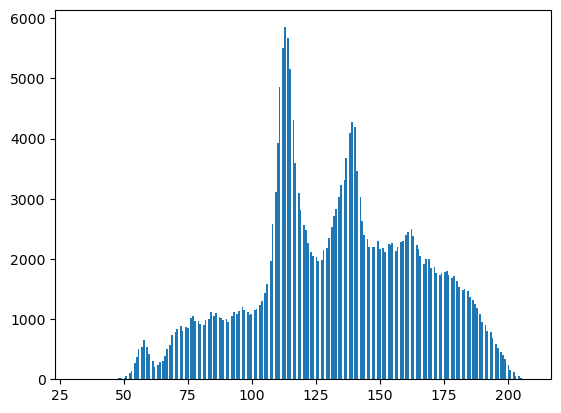

In [10]:
h = plt.hist(im_org.ravel(), bins=nbins)

The value of a given bin can be found by:



In [11]:
bin_no = 100
count = h[0][bin_no] # se pone 0 porque va por tuplas, pero h[0hace referencia a todos los valores dentro del vector del histo]
print(f"There are {count} pixel values in bin {bin_no}")

#Compute the histogram, which gives you:
#h[0]: The counts of pixels in each bin (frequency). es como si fuera la y
#h[1]: The bin edges (intensity ranges). es como si fuera la x

There are 1147.0 pixel values in bin 100


In [15]:
bin_left = h[1][bin_no] #h1 son los bordes
bin_right = h[1][bin_no + 1]
print(f"Bin edges: {bin_left} to {bin_right}  ")

Bin edges: 100.75 to 101.4375  


## Ex 9

Exercise 9: Use the histogram function to find the most common range of intensities? (hint: you can use the list functions max and argmax).

Max count: 5848.0 at: 117


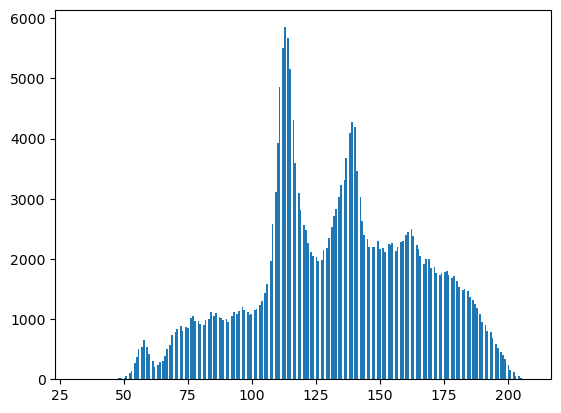

In [19]:
# Since the number of bins match the number of different intensities in the image, it may be confusing.
# Max_at represent the bin number, not the most common intensity (although in this case change).
# If you do not understand what I mean, Repeat this and exercise 9 using bin_no to 4 and reflect on the results.

y, x, _ = plt.hist(im_org.ravel(), bins=nbins)
max_count = y.max()   # valor máximo del histograma
max_at = y.argmax()   # el bin con valor maximo
print(f"Max count: {max_count} at: {max_at}")

In [ ]:
# Rather than the position of the maximum count, I want to know the most common range of intensities

 # para saber el raango con mayor intesidad
bin_left = h[1][max_at]    #rango izq
bin_right = h[1][max_at + 1]   #rango derecha
print(f"Bin edges: {bin_left} to {bin_right}")  

Bin edges: 112.4375 to 113.125


## Ex 10 Pixel values and image coordinate systems

(row, col) or (r, c)) with (0, 0) at the top-left corner.

In [46]:
r = 100
c = 90

im_org = io.imread(os.path.join(in_dir, im_name))
im_val = im_org[r, c]  #intesidad de pixel en esa coordenada
print(f"The pixel value at (r,c) = ({r}, {c}) is: {im_val}")


The pixel value at (r,c) = (100, 90) is: 119


## Ex 11

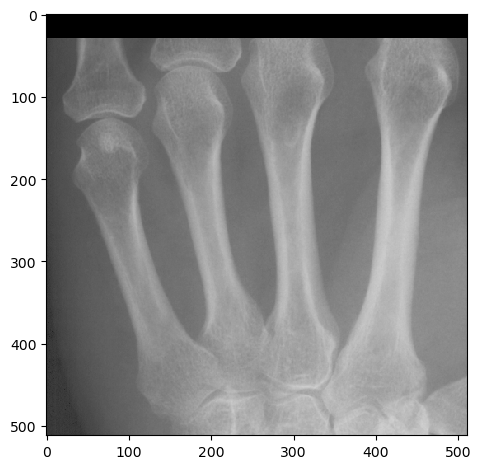

In [47]:
im_org[:30] = 0 # pone a 0 todos los pixeles de las filas hasta la 30
io.imshow(im_org)
io.show()


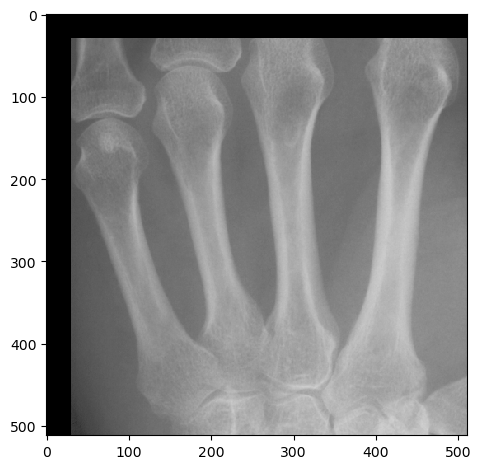

In [48]:
im_org[:, :30] = 0 # pone a 0 todos los pixeles de las columnas hasta la 30
io.imshow(im_org)
io.show()


## Ex 12
A mask is a binary image of the same size as the original image, where the values are either 0 or 1 (or True/False).

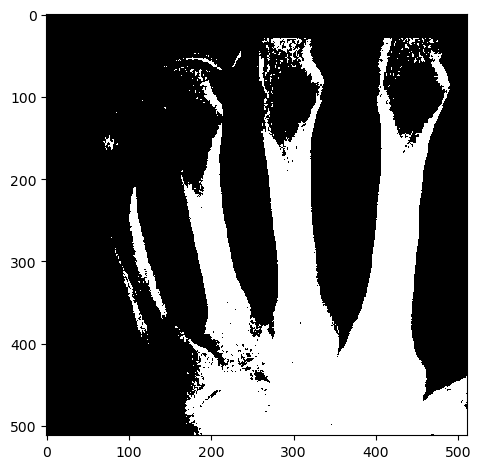

In [ ]:

#Para cada píxel de la imagen, si 
# el valor de intensidad es mayor que 150, 
# el valor correspondiente en la máscara será True (o 1 en NumPy).
mask = im_org > 150
io.imshow(mask)
io.show()


## Ex 13

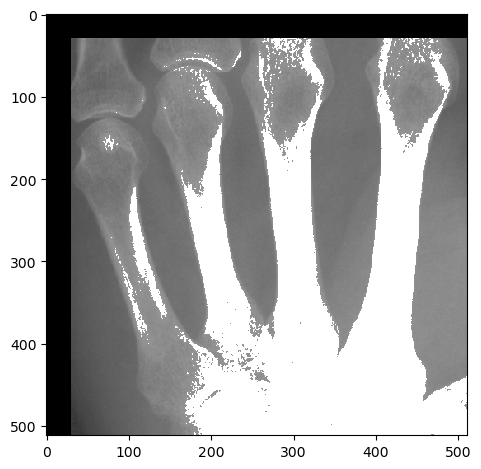

In [ ]:
im_org[mask] = 255 # si im:org> 150 es decir TRUE, se ponen a 255
io.imshow(im_org)
io.show()

## Ex 14 Color images


Exercise 14: Read the image and print the image dimensions and its pixel type. How many rows and columns do the image have?

shape (600, 800, 3)
uint8


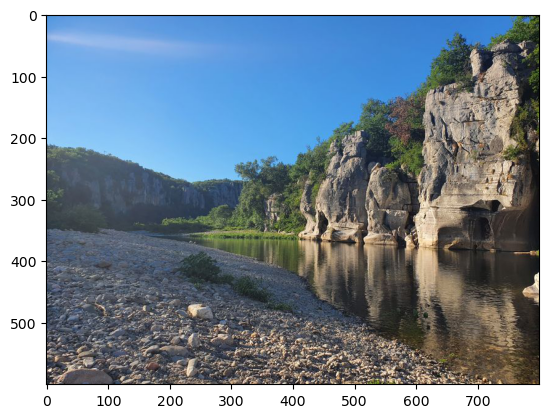

In [6]:
im = io.imread(in_dir + 'ardeche.jpg')
print('shape',im.shape)
print(im.dtype)
plt.imshow(im)
plt.show()

## Ex 15

In [7]:
r = 110
c = 90
print(f"The pixel value at (r,c) = ({r}, {c}) is: {im[r, c, :]}") # para los tres valores rgb


The pixel value at (r,c) = (110, 90) is: [119 178 238]


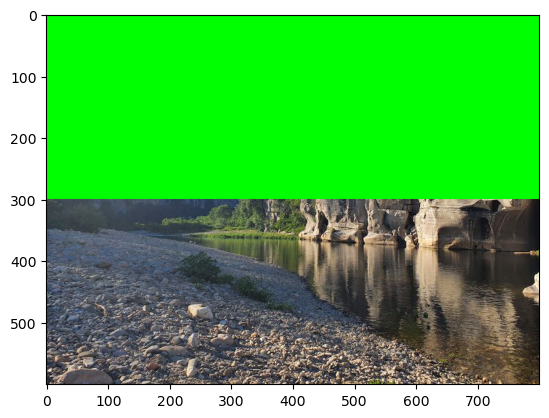

In [ ]:
#me lo invento, pero es para ver que se puede cambiar el color de donde quieras, esto no lo puedes hacer en blancos y negros
#intentnado hacer el de abajo
rnew=300

#Asi pra ponerlo todo verde
im[:rnew] = [0, 255,0]
plt.imshow(im)
plt.show()

## Ex 16  
Try to use NumPy slicing to color the upper half of the photo green.

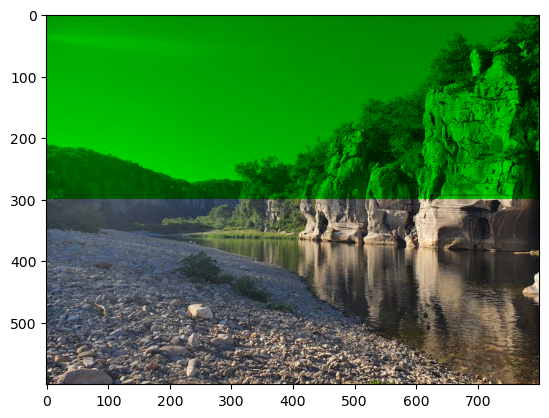

In [8]:
r_2, _, _ = np.array(im.shape) // 2 # para la mitad de la altura de las filas.

#Asi pra quitarles las componentes roja 0 y blue 2 la (la 1 sería la  green )

im[:r_2, :, [0,2]] = 0  # modificar a verde
plt.imshow(im)
plt.show()

## Ex 17
Start by reading the image and examine the size of it.

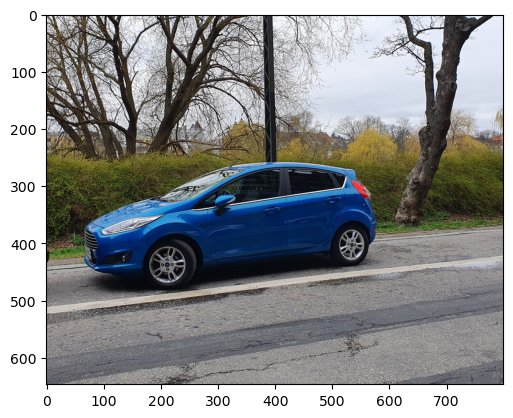

In [9]:
im_org = io.imread(in_dir + 'car.png')
plt.imshow(im_org)
plt.show()

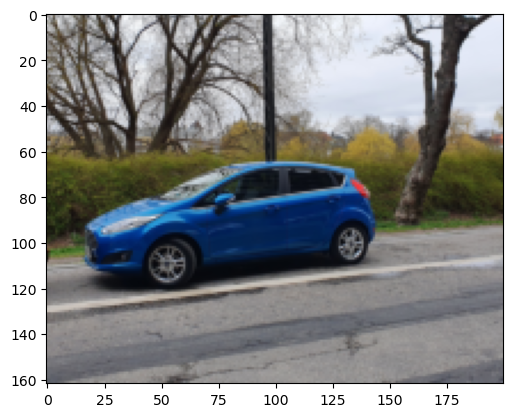

In [ ]:
image_rescaled = rescale(im_org, 0.25, anti_aliasing=True, channel_axis=2) 
#    el 0,25 sacel, reduce la imagen al  25% de su tamaño
#    anti_aliasing para mantener calidad
# el chanel es para indicar qeu es rgb (ponlo si es rgb y ya)
plt.imshow(image_rescaled)
plt.show()



## Ex 18
What is the type of the pixels after rescaling? Try to show the image and inspect the pixel values. Are they still in the range of [0, 255]?b

The function rescale scales the height and the width of the image with the same factor. The resize functions can scale the height and width of the image with different scales. For example:

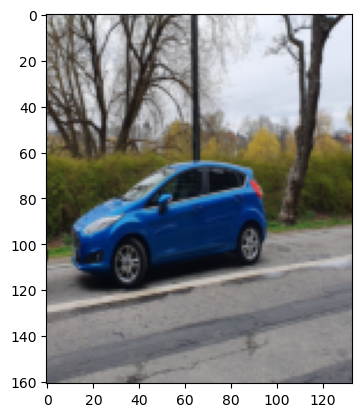

In [18]:
image_resized = resize(im_org, (im_org.shape[0] // 4,
                       im_org.shape[1] // 6),
                       anti_aliasing=True)

plt.imshow(image_resized)
plt.show()

In [20]:
print(image_rescaled.dtype)
print(image_rescaled.dtype)
print(image_rescaled.max())
print(image_rescaled.min())

float64
float64
0.9933274669865821
0.003037670421336431


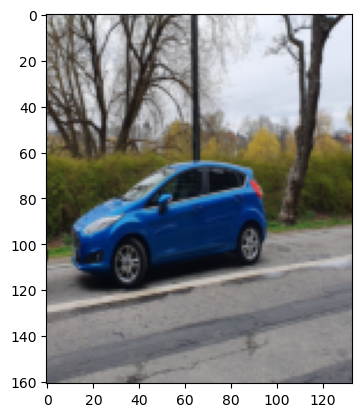

In [21]:
image_resized = resize(im_org, (im_org.shape[0] // 4, im_org.shape[1] // 6), anti_aliasing=True)
plt.imshow(image_resized)
plt.show()

## Ex 19
Try to find a way to automatically scale your image so the resulting width (number of columns) is always equal to 400, no matter the size of the input image?

Aquí:
_ es la altura (se ignora).
c es el número de columnas (ancho de la imagen).
_ es el número de canales (también ignorado).


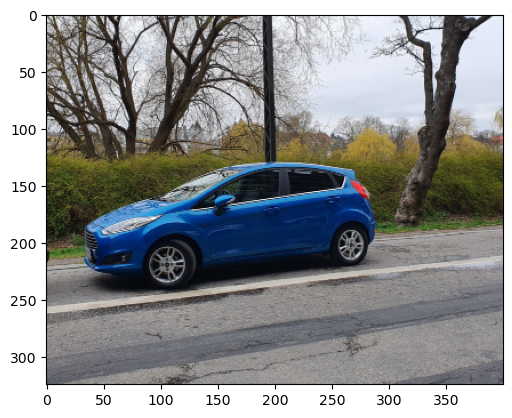

In [39]:
im_org = io.imread(in_dir + 'car.png')
_, c, _ = im_org.shape   #(altura, ancho, canales).
rescale_factor = 1 / (c / 400)    # = (400/c) para sacar el factor y qeu de siemore eso se divide eso por lo original si tiene
# 200 de ancho, 400/200=0,5, ese es el factor


image_rescaled = rescale(im_org, rescale_factor, anti_aliasing=True, channel_axis=2)
plt.imshow(image_rescaled)
plt.show()

Lo mismo para el alto


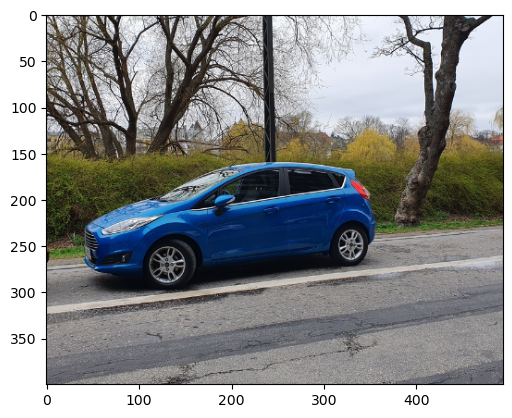

In [55]:
from skimage.transform import resize

# Ajusta el alto a 400 píxeles y calcula el ancho proporcionalmente
h, w, _ = im_org.shape
new_width = int((400 / h) * w)  # Ajusta el ancho proporcionalmente

# Redimensiona la imagen
image_resized = resize(im_org, (400, new_width), anti_aliasing=True)

# Muestra la imagen redimensionada
plt.imshow(image_resized)
plt.show()


In [56]:
print(image_rescaled.shape)
print(image_rescaled2.shape)

(324, 400, 3)
(400, 495, 3)


## Ex 20 
Take an image that is very dark and another very light image. Compute and visualise the histograms for the two images. Explain the difference between the two.

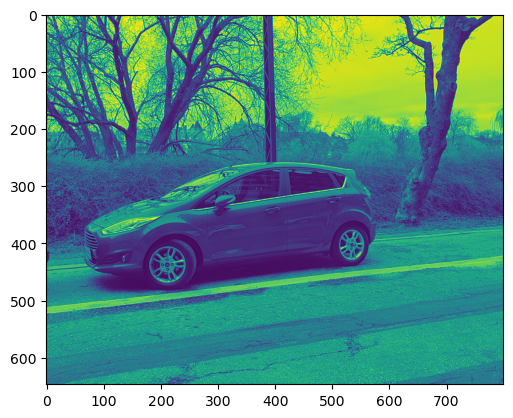

In [58]:
im_gray = color.rgb2gray(im_org)
im_byte = img_as_ubyte(im_gray)
# Muestra la imagen redimensionada
plt.imshow(im_byte)
plt.show()

## Ex 21

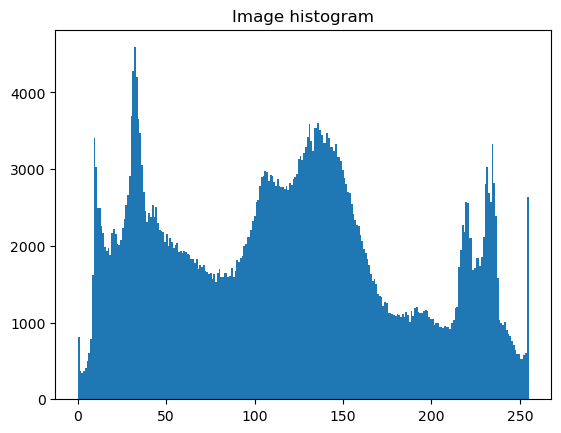

In [60]:
nbins=256
plt.hist(im_byte.ravel(), bins=nbins)
plt.title('Image histogram')
io.show()

Exercise 20: Take an image that is very dark and another very light image. Compute and visualise the histograms for the two images. Explain the difference between the two.

Exercise 21: Take an image with a bright object on a dark background. Compute and visualise the histograms for the image. Can you recognise the object and the background in the histogram?

## Ex 22 and 23 Color channels
 intensity values of the different channels of a color (RGB) image taken at DTU.

Exercise 22: Start by reading and showing the DTUSign1.jpg image.

You can visualise the red (R) component of the image using:

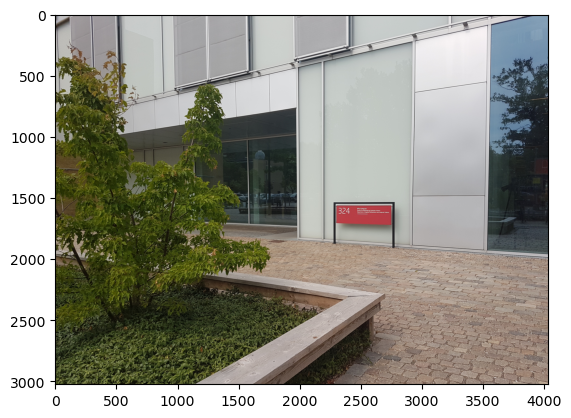

In [62]:
im_org = io.imread(in_dir + 'DTUSign1.jpg')
plt.imshow(im_org)
plt.show()

In [ ]:
#you can visualise the red (R) component of the image using:


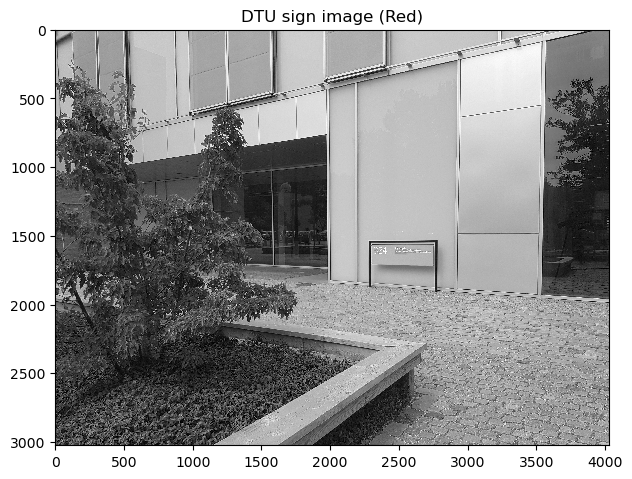

In [67]:
r_comp = im_org[:, :, 0]   #0 para rojo 1 para greem 2 blue
io.imshow(r_comp)
plt.title('DTU sign image (Red)')
io.show()

Exercise 23: Visualize the R, G, and B components individually. Why does the DTU Compute sign look bright on the R channel image and dark on the G and B channels? Why do the walls of the building look bright in all channels?

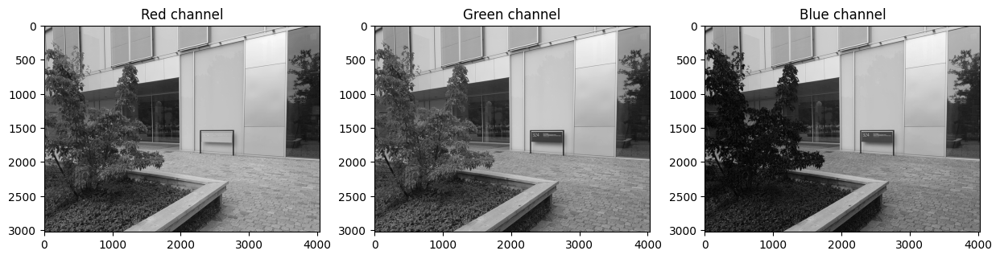

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15,10))
ax[0].imshow(im_org[:,:,0], cmap = 'gray')
ax[0].set_title('Red channel')
ax[1].imshow(im_org[:,:,1], cmap = 'gray')
ax[1].set_title('Green channel')
ax[2].imshow(im_org[:,:,2], cmap = 'gray')
ax[2].set_title('Blue channel')
plt.show()

# CUANTO MÄS BRILLANTE MÄS PRESENCIA DE ESE COLOR en la imagen
#En una imagen en color, el blanco es una combinación de intensidades máximas iguales de R, G y B. 
# Por ejemplo, en un modelo RGB de 8 bits, el blanco puro es (255, 255, 255).

## Simple Image Manipulations


## Ex 24

You can create a black rectangle in the image, by setting all RGB channels to zero in a given region. This is also an example of using NumPy slicing:

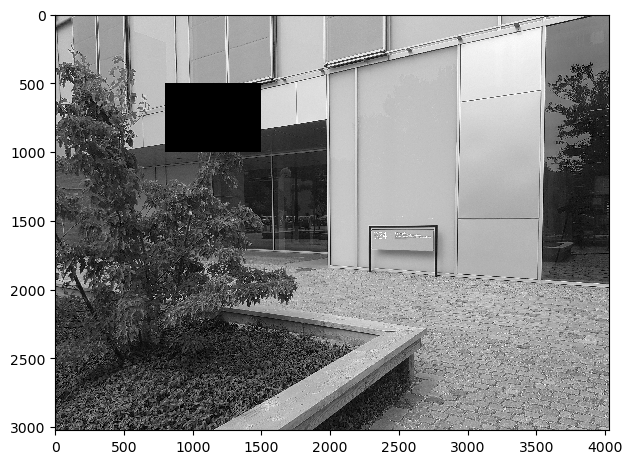

In [ ]:
out_dir = 'results/'
# crea el dorectorio
os.makedirs(out_dir, exist_ok=True)
im_org[500:1000, 800:1500, :] = 0
io.imshow(r_comp)
io.show()

## Ex 25
Show the image again and save it to disk as DTUSign1-marked.jpg using the io.imsave function. Try to save the image using different image formats like for example PNG.

In [70]:
io.imsave(out_dir + 'DTUSign1-marked.jpg', im_org)
io.imsave(out_dir + 'DTUSign1-marked.png', im_org)
io.imsave(out_dir + 'DTUSign1-marked.tif', im_org)

## Ex 26

Try to create a blue rectangle squared around the DTU Compute sign and save the resulting image.

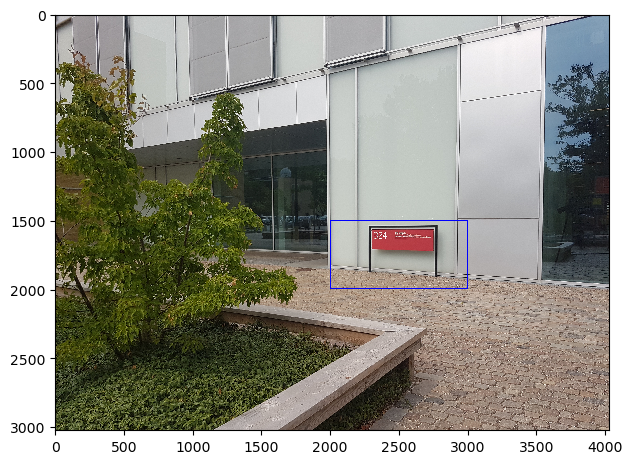

In [ ]:
im_org = io.imread(in_dir + 'DTUSign1.jpg')
im_copy = im_org.copy()

# esto crea un cuadrado
#(altura, ancho , RGB)    (ROW, CoLUMNS)
im_copy[1500:2000, 2000:3000, :] = 0  # lo vuelve negro
im_copy[1500:2000, 2000:3000, 2] = 255  # lo vuelve azul

#Esto muestra la imagen dentro del cuadrado metiendo esas coordenas usando las de la imagen principal.
#  para qeu haya lo de dentro:
im_copy[1505:1995, 2005:2995, :] = im_org[1505:1995, 2005:2995, :]

io.imshow(im_copy)
io.show()

#io.imsave(out_dir + 'DTUSign1-marked_blue.jpg', im_copy)

## Ex 27
Try to automatically create an image based on metacarpals.png where the bones are colored blue. You should use color.gray2rgb and pixel masks.

[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]


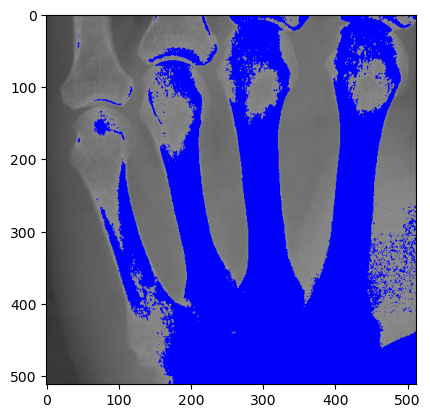

In [ ]:
im_org = io.imread(in_dir + 'metacarpals.png')
mask = im_org > 140
# line converts the grayscale image to an RGB format.
#This is necessary because we want to change the color of the bones from gray to blue.
im_rgb = color.gray2rgb(im_org)
print(mask)

# cuando solo quieres azul pones las demas a 0 a todas
im_rgb[mask, 0] = 0
im_rgb[mask, 1] = 0
im_rgb[mask, 2] = 255

plt.imshow(im_rgb)
io.show()

## Ex 28

Start by reading the image metarcarpals.png. To investigate the properties of the hollow bone, a grey-level profile can be sampled across the bone. The tool profile_line can be used to sample a profile across the bone:

Esto es util por ejemplo si quieres hacer la máscara pues pa saber que valores cortas, ya que donde este la diferencia pues por ahi cortas y será una detección más efectiva

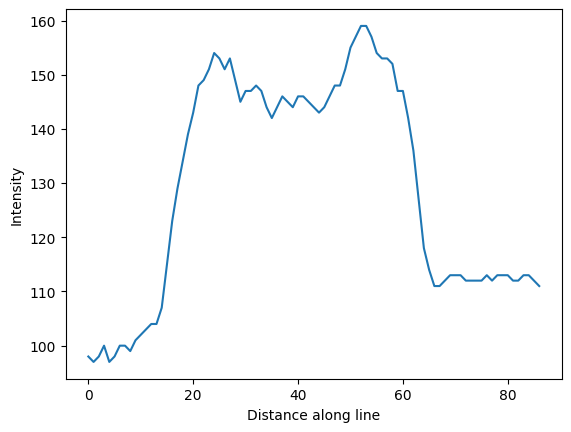

In [37]:
im_org = io.imread(in_dir + 'metacarpals.png')
p = profile_line(im_org, (342, 77), (320, 160))
plt.plot(p)
plt.ylabel('Intensity')
plt.xlabel('Distance along line')
plt.show()

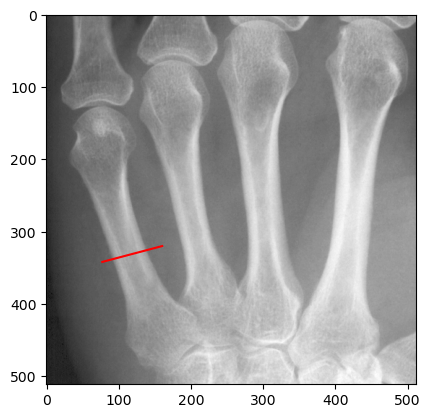

In [101]:
# cmap para gray 
plt.imshow(im_org, cmap = 'gray')

# to draw a line between this points
         # lo qeu miden de ancho y lo de alto
plt.plot([77, 160],             [342, 320], c = 'r')
io.show()

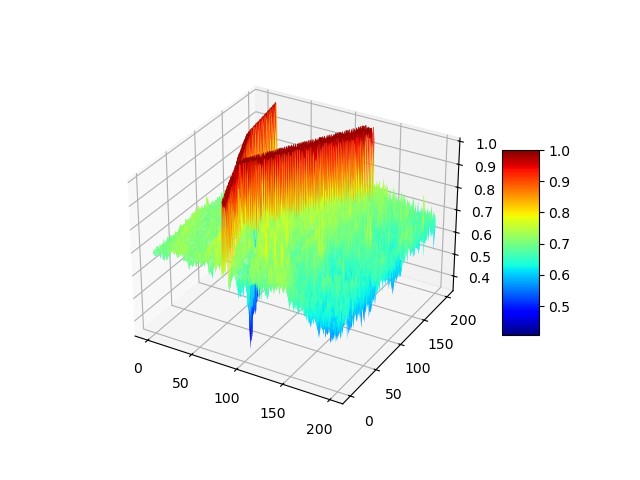

In [104]:
%matplotlib widget

in_dir = "data/"
im_name = "road.png"
im_org = io.imread(in_dir + im_name)
im_gray = color.rgb2gray(im_org)
ll = 200
im_crop = im_gray[40:40 + ll, 150:150 + ll]
xx, yy = np.mgrid[0:im_crop.shape[0], 0:im_crop.shape[1]]
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
surf = ax.plot_surface(xx, yy, im_crop, rstride=1, cstride=1, cmap=plt.cm.jet,
linewidth=0)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()

## DICOM images


## Ex 29

In [ ]:
%matplotlib inline

in_dir = "data/"
im_name = "1-442.dcm"
ds = dicom.dcmread(in_dir + im_name)
print(ds)


Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 174
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 61.7.148187188172271071649499494197343400503
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'dcm4che-1.4.34'
-------------------------------------------------
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY']
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 61.7.148187188172271071649499494197343400503
(0008, 0020) Study Date                          DA: '20140914'
(0008, 0030) Study Time                          TM: ''
(0008, 0050) Accession N

In [118]:
# sin esto no cargas la imagen dicom.

im = ds.pixel_array


## Ex 29
What is the size (number of rows and columns) of the DICOM slice?

In [109]:
print(im.shape)
print(im.dtype)

(512, 512)
int16


## Ex 30
Try to find the shape of this image and the pixel type? Does the shape match the size of the image found by inspecting the image header information?

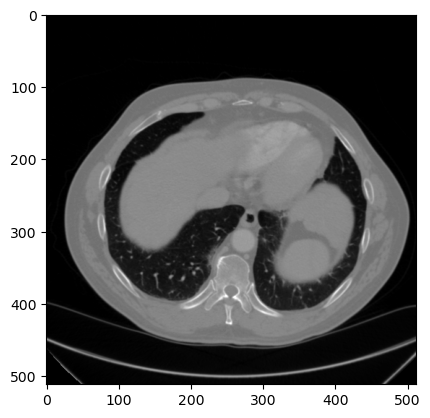

In [119]:
#the pixel values are stored as 16 bit integers and therefore it is necessary to specify 
# which value range that should be mapped to the gray scale spectrum (using vmin and vmax)
plt.imshow(im, vmin=-1000, vmax=1000, cmap='gray')
plt.show()